<h1> Task 4: Exploratory Data Analysis(EDA)</h1>

<b>Dylan Tan</b>

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import pandas_profiling as pdp


In [4]:
def load_and_process(url_or_path_to_csv_file):

    # Method Chain 1 (Load data, deal with missing data, sort data, and reset index)

    df1 = (
          pd.read_csv(url_or_path_to_csv_file)
          .dropna()
          .sort_values('quality', ascending=True)
          .reset_index(drop=True)
      )
    
    # Method Chain 2 (Create new columns, drop others, and do processing)
    
    df2 = (
        df1.rename(columns = {"free sulfur dioxide":"free SO2"})
          .rename(columns = {"total sulfur dioxide":"total SO2"})
          .assign(high_quality = lambda x: df1['quality']>4)
          .reset_index(drop=True).loc[df1['residual sugar']<20] #removes outliers from residual sugars
        .loc[df1['residual sugar']<20] #removes outliers from variables using limits determined by box plots
        .loc[df1['residual sugar']>2]
          .loc[df1['fixed acidity']<9]
        .loc[df1['volatile acidity']<0.52]
        .loc[df1['citric acid']<0.55]
      )
    # Make sure to return the latest dataframe

    return df2

In [5]:
df = load_and_process("../../data/raw/winequality-white.csv")
df = df[df['high_quality']==True]  
df = df.drop(columns = ['high_quality'])#remove outliers
df = df.round({"alcohol": 0})   #round alcohol to nearest integer
df = df.dropna()
df = df.reset_index()
df = df.drop(['index'], axis=1)
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free SO2,total SO2,density,pH,sulphates,alcohol,quality
0,6.4,0.30,0.38,7.8,0.046,35.0,192.0,0.99550,3.10,0.37,9.0,5
1,7.8,0.24,0.38,2.1,0.058,14.0,167.0,0.99400,3.21,0.55,10.0,5
2,5.4,0.24,0.18,2.3,0.050,22.0,145.0,0.99207,3.24,0.46,10.0,5
3,7.7,0.31,0.36,4.3,0.026,15.0,87.0,0.99152,3.11,0.48,12.0,5
4,7.6,0.39,0.46,11.7,0.084,55.0,170.0,0.99773,2.91,0.51,9.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...
3000,7.1,0.25,0.39,2.1,0.036,30.0,124.0,0.99080,3.28,0.43,12.0,8
3001,6.9,0.21,0.28,2.4,0.056,49.0,159.0,0.99440,3.02,0.47,9.0,8
3002,6.4,0.22,0.32,7.2,0.028,15.0,83.0,0.99300,3.13,0.55,11.0,8
3003,6.9,0.36,0.34,4.2,0.018,57.0,119.0,0.98980,3.28,0.36,13.0,9


In [6]:
df.head()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free SO2,total SO2,density,pH,sulphates,alcohol,quality
0,6.4,0.30,0.38,7.8,0.046,35.0,192.0,0.99550,3.10,0.37,9.0,5
1,7.8,0.24,0.38,2.1,0.058,14.0,167.0,0.99400,3.21,0.55,10.0,5
2,5.4,0.24,0.18,2.3,0.050,22.0,145.0,0.99207,3.24,0.46,10.0,5
3,7.7,0.31,0.36,4.3,0.026,15.0,87.0,0.99152,3.11,0.48,12.0,5
4,7.6,0.39,0.46,11.7,0.084,55.0,170.0,0.99773,2.91,0.51,9.0,5


In [7]:
df.describe(exclude = np.object).T


,count,mean,std,min,25%,50%,75%,max
fixed acidity,3005.0,6.808386,0.716655,3.80000,6.3000,6.800,7.3000,8.90000
volatile acidity,3005.0,0.274276,0.079053,0.09000,0.2200,0.265,0.3200,0.51000
citric acid,3005.0,0.318998,0.087231,0.00000,0.2600,0.310,0.3700,0.54000
residual sugar,3005.0,8.397804,4.380384,2.05000,4.8000,7.700,11.8000,19.95000
chlorides,3005.0,0.045869,0.020246,0.01200,0.0360,0.044,0.0510,0.34600
free SO2,3005.0,38.056073,16.040466,2.00000,26.0000,36.000,49.0000,131.00000
total SO2,3005.0,146.218469,40.975257,24.00000,115.0000,143.000,176.0000,313.00000
density,3005.0,0.994808,0.002797,0.98816,0.9927,0.995,0.9969,1.00241
pH,3005.0,3.180636,0.142037,2.79000,3.0900,3.170,3.2600,3.82000
sulphates,3005.0,0.486333,0.110171,0.22000,0.4100,0.470,0.5400,1.08000


<b><i>Check count of each column</i></b>

In [8]:
df.count()

fixed acidity       3005
volatile acidity    3005
citric acid         3005
residual sugar      3005
chlorides           3005
free SO2            3005
total SO2           3005
density             3005
pH                  3005
sulphates           3005
alcohol             3005
quality             3005
dtype: int64

<b><i>Check number of columns</i></b>

In [9]:
len(df.columns)

12

<b><i>Check number of rows</i></b>

In [10]:
df.shape[0]


3005

<b>Get profile report</b>

In [11]:
pdp.ProfileReport(df)


Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

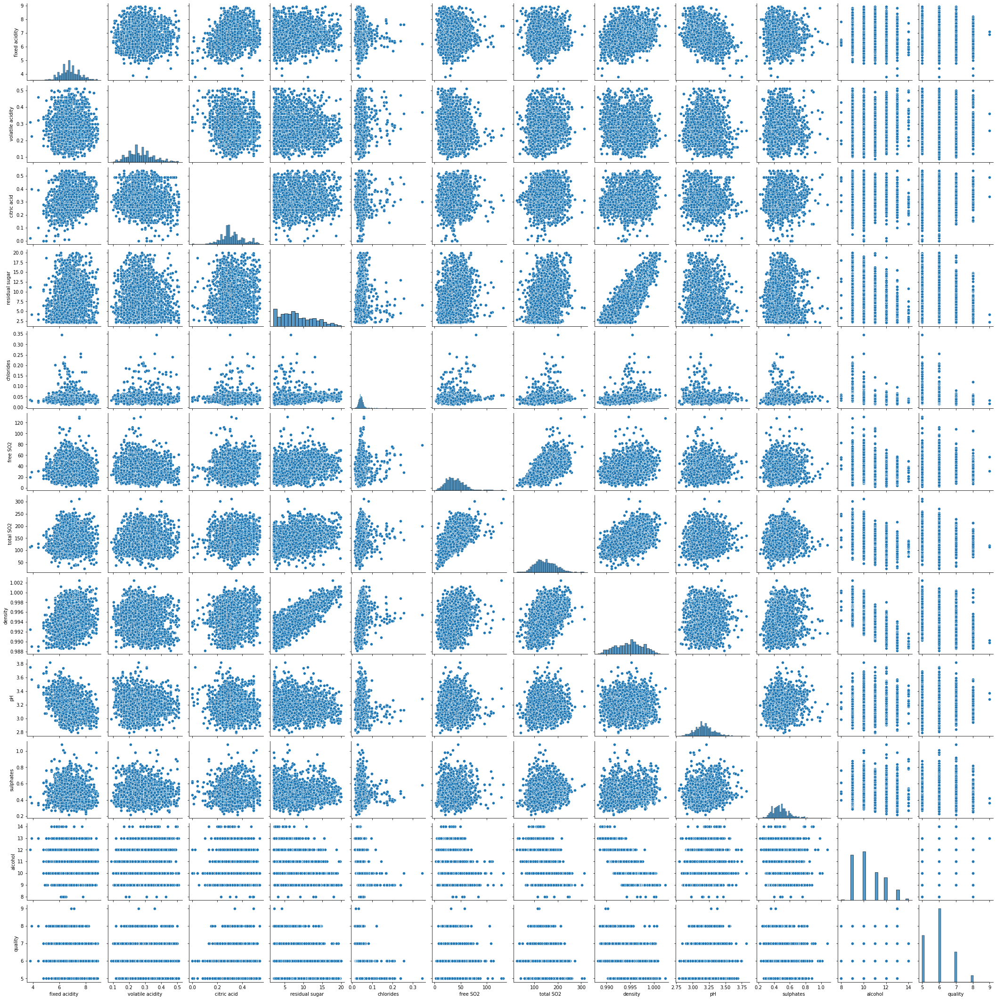

In [12]:
sns.pairplot(df)

Text(0.5, 1.0, 'Quality vs Alcohol plot')

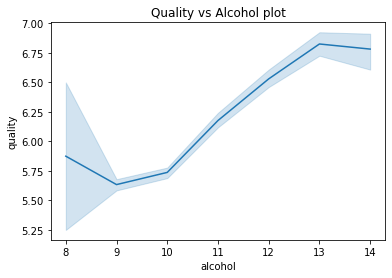

In [13]:
sns.lineplot(data = df, x = 'alcohol',y='quality').set_title("Quality vs Alcohol plot")

Text(0.5, 1.0, 'Counts of wine quality classified by alcohol percentage')

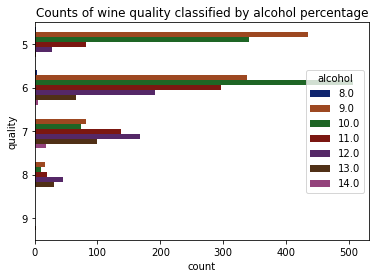

In [14]:
sns.countplot(data = df,
             y = 'quality',
             palette='dark',
             hue = 'alcohol').set_title("Counts of wine quality classified by alcohol percentage")

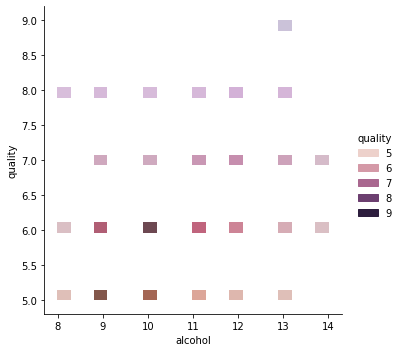

In [15]:
sns.displot(data=df,hue='quality',x='alcohol',y='quality')

Text(0.5, 1.0, 'Quality vs Acidity plot')

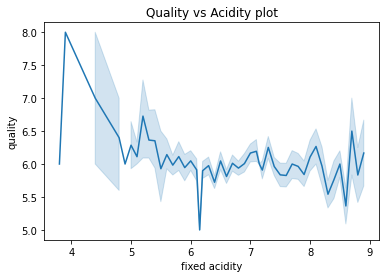

In [16]:
sns.lineplot(data = df, x = 'fixed acidity',y='quality').set_title("Quality vs Acidity plot")

Text(0.5, 1.0, 'Counts of wine quality classified by fixed percentage')

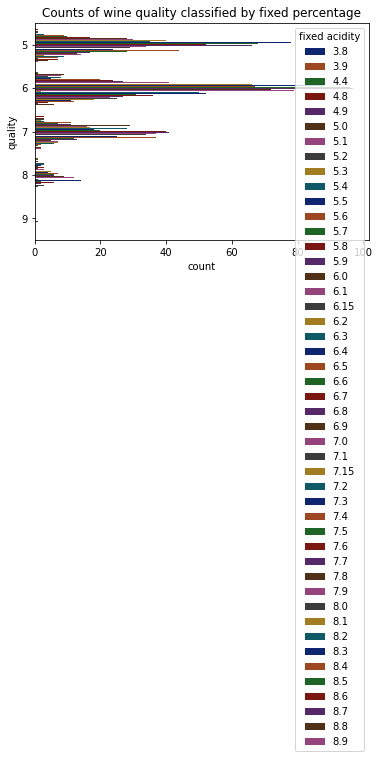

In [17]:
sns.countplot(data = df,
             y = 'quality',
             palette='dark',
             hue = 'fixed acidity').set_title("Counts of wine quality classified by fixed percentage")

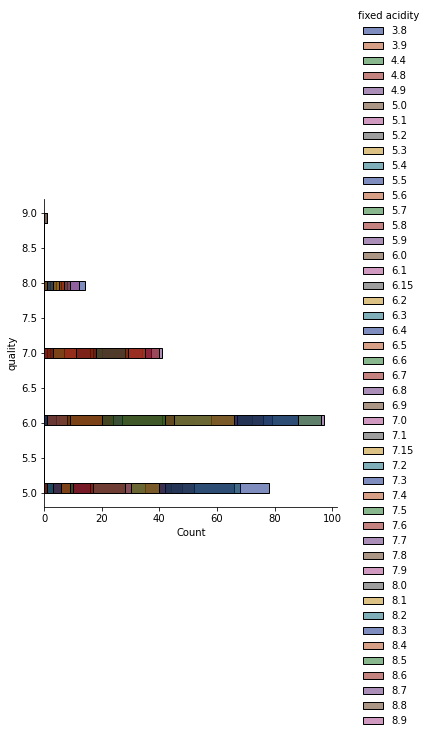

In [18]:
sns.displot(data = df,
             y = 'quality',
             palette='dark',
             hue = 'fixed acidity')

**<h1>Summary and conclusions (Task 5: Analysis)</h1>**
**<h3><i>*Note: this is not the full analysis, just some of my key takeaways, the complete analysis is in the other file where everyone's work is found</i></h3>**

Based on the plots and graphs, there is a positive correlation between alcohol and wine quality. If we look at the line plot, as alcohol percentage increases, so does the wine quality. This could be due to how alcohol content affects the wine's body. A higher alcohol content is usually associated with a richer and fuller texture, which is why it could be seen as higher quality. Moreover, if we compare the colors of the bars in each quality(from the countplot), we can see that as the wine quality increases, the colors start to shift towards the higher alcohol percentage's colors. While there are some lower alcohol percentages at those high wine quality ranges, the count is very low , so we can see it as outliers. The higher alcohol percentages have higher counts in higher wine quality values, which indicates that there indeed is a positive correlation between alcohol percentage and wine quality.Therefore, the plot above has shown that alcohol percentage does play a big part into determining the quality of the wine. (This is based on Dylan's EDA, so checkout Dylan's milestone2.ipynb in the analysis folder to see the plots that were mentioned here).

Moreover, we can see that as fixed acidity increases, the wine quality decreases. Looking at the lineplot, while there are some outliers, we can still see that there is an inverse correlation. Thus, this is another variable besides alcohol that is a big contributor to the quality of the wine. Similar to alcohol, we can see that as the quality of wine increases, the colors from the countplot seem to shift towards lower fixed acidity. When we remove outliers, we can see that there is indeed an obvious inverse correlation between wine quality and fixed acidity. This proves that the fixed acidity variable is plays an important role in determining the quality of the wine. It is difficult to see the correlation  if you look at the countplot and displot first before looking at the lineplot, but after seeing the lineplot, a correlation will be quite obvious(This is based on Dylan's EDA, so checkout Dylan's milestone2.ipynb in the analysis folder to see the plots that were mentioned here).